step:1 import libraries

In [2]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier

Step 2: Prepare dataset.

In [3]:
#Predictor variables
Outlook = ['Rainy', 'Rainy', 'Overcast', 'Sunny', 'Sunny', 'Sunny','Overcast','Rainy', 'Rainy', 'Sunny', 'Rainy','Overcast', 'Overcast','Sunny']
Temperature = ['Hot', 'Hot', 'Hot', 'Mild', 'Cool', 'Cool', 'Cool','Mild', 'Cool', 'Mild', 'Mild', 'Mild', 'Hot', 'Mild']
Humidity = ['High', 'High', 'High', 'High', 'Normal', 'Normal', 'Normal',
'High', 'Normal', 'Normal', 'Normal', 'High', 'Normal','High']
Wind = ['False', 'True', 'False', 'False', 'False', 'True', 'True',
'False', 'False', 'False', 'True', 'True', 'False', 'True']
#Class Label:
Play = ['No', 'No', 'Yes', 'Yes', 'Yes', 'No', 'Yes', 'No',
'Yes', 'Yes', 'Yes', 'Yes', 'Yes', 'No']

Step 3: Digitize the data set using encoding

In [4]:
#creating labelEncoder
le = preprocessing.LabelEncoder()
# Converting string labels into numbers.
Outlook_encoded = le.fit_transform(Outlook)
Outlook_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Outllok mapping:",Outlook_name_mapping)
Temperature_encoded = le.fit_transform(Temperature)
Temperature_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Temperature mapping:",Temperature_name_mapping)
Humidity_encoded = le.fit_transform(Humidity)
Humidity_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Humidity mapping:",Humidity_name_mapping)
Wind_encoded = le.fit_transform(Wind)
Wind_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Wind mapping:",Wind_name_mapping)
Play_encoded = le.fit_transform(Play)
Play_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Play mapping:",Play_name_mapping)
print("\n\n")
print("Weather:" ,Outlook_encoded)
print("Temerature:" ,Temperature_encoded)
print("Humidity:" ,Humidity_encoded)
print("Wind:" ,Wind_encoded)
print("Play:" ,Play_encoded)


Outllok mapping: {'Overcast': 0, 'Rainy': 1, 'Sunny': 2}
Temperature mapping: {'Cool': 0, 'Hot': 1, 'Mild': 2}
Humidity mapping: {'High': 0, 'Normal': 1}
Wind mapping: {'False': 0, 'True': 1}
Play mapping: {'No': 0, 'Yes': 1}



Weather: [1 1 0 2 2 2 0 1 1 2 1 0 0 2]
Temerature: [1 1 1 2 0 0 0 2 0 2 2 2 1 2]
Humidity: [0 0 0 0 1 1 1 0 1 1 1 0 1 0]
Wind: [0 1 0 0 0 1 1 0 0 0 1 1 0 1]
Play: [0 0 1 1 1 0 1 0 1 1 1 1 1 0]


In [5]:
import pandas as pd
import sklearn

In [6]:
df1 = pd.DataFrame({'Outlook':Outlook,'Temperature':Temperature})
df2 = pd.DataFrame({'Outlook':Outlook,'Humidity':Humidity})
df3 = pd.DataFrame({'Outlook':Outlook,'Wind':Wind})
df4 = pd.DataFrame({'Outlook':Outlook,'Play':Play})
df5 = pd.DataFrame({'Temperature':Temperature,'Humidity':Humidity})
df6 = pd.DataFrame({'Temperature':Temperature,'Wind':Wind})
df7 = pd.DataFrame({'Temperature':Temperature,'Play':Play})
df8 = pd.DataFrame({'Humidity':Humidity,'Wind':Wind})
df9 = pd.DataFrame({'Humidity':Humidity,'Play':Play})
df10 = pd.DataFrame({'Wind':Wind,'Play':Play})
display(df1,df2)

,Outlook,Temperature
0,Rainy,Hot
1,Rainy,Hot
2,Overcast,Hot
3,Sunny,Mild
4,Sunny,Cool
5,Sunny,Cool
6,Overcast,Cool
7,Rainy,Mild
8,Rainy,Cool
9,Sunny,Mild


,Outlook,Humidity
0,Rainy,High
1,Rainy,High
2,Overcast,High
3,Sunny,High
4,Sunny,Normal
5,Sunny,Normal
6,Overcast,Normal
7,Rainy,High
8,Rainy,Normal
9,Sunny,Normal


In [7]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

In [8]:
import pandas as pd
clf = DecisionTreeClassifier()
features_dataset=tuple(zip(Outlook_encoded,Temperature_encoded,Humidity_encoded,Wind_encoded))
print(features_dataset)

((1, 1, 0, 0), (1, 1, 0, 1), (0, 1, 0, 0), (2, 2, 0, 0), (2, 0, 1, 0), (2, 0, 1, 1), (0, 0, 1, 1), (1, 2, 0, 0), (1, 0, 1, 0), (2, 2, 1, 0), (1, 2, 1, 1), (0, 2, 0, 1), (0, 1, 1, 0), (2, 2, 0, 1))


In [9]:
x_train,x_test,y_train,y_test=train_test_split(features_dataset,Play_encoded,test_size=0.2,random_state=0)

In [24]:
data_entropy=DecisionTreeClassifier(criterion="gini",random_state=28,max_depth=5,max_leaf_nodes=28)
data_entropy.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=28, random_state=28)

In [26]:
y_pred=data_entropy.predict(x_test)
print("Predicted Y: ",y_pred)
new_pred=data_entropy.predict([(1,2,1,0)])
print("Predicted New: ",new_pred)
# Outllok mapping: {'Overcast': 0, 'Rainy': 1, 'Sunny': 2}
# Temperature mapping: {'Cool': 0, 'Hot': 1, 'Mild': 2}
# Humidity mapping: {'High': 0, 'Normal': 1}
# Wind mapping: {'False': 0, 'True': 1}
# Play mapping: {'No': 0, 'Yes': 1}

Predicted Y:  [0 1 0]
Predicted New:  [1]


In [27]:
new_pred=data_entropy.predict([(2,0,0,1)])
print("Predicted New: ",new_pred)

Predicted New:  [0]


In [30]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
from subprocess import call
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn import tree

In [31]:
clf = tree.DecisionTreeClassifier(criterion="gini")
clf = clf.fit(x_train, y_train)


In [33]:
clf = tree.DecisionTreeClassifier(criterion="gini")
clf = clf.fit(x_train, y_train)

from sklearn import metrics

y_pred = clf.predict(x_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test,y_pred))
print("Recall:",metrics.recall_score(y_test,y_pred))
print("F1 score:",metrics.f1_score(y_test,y_pred))

Accuracy: 0.3333333333333333
Precision: 1.0
Recall: 0.3333333333333333
F1 score: 0.5


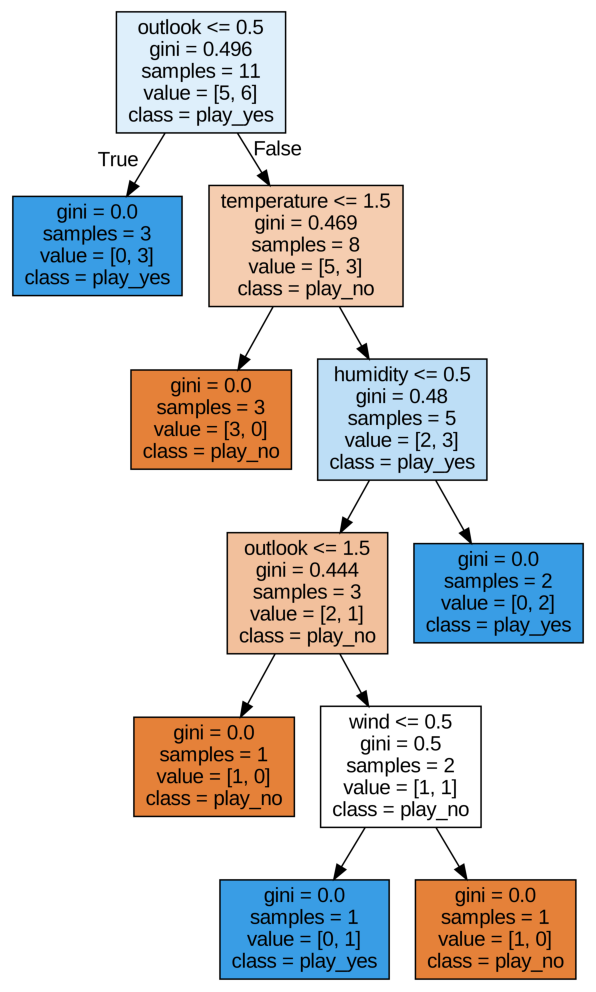

In [25]:
export_graphviz(data_entropy,out_file='tree_entropy.dot',feature_names=['outlook','temperature','humidity','wind'],
                class_names=['play_no','play_yes'],filled=True)

call(['dot', '-Tpng', 'tree_entropy.dot', '-o', 'tree_entropy.png','-Gdpi=600'])

plt.figure(figsize = (14, 18))
plt.imshow(plt.imread('tree_entropy.png'))
plt.axis('off');
plt.show();

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import load_iris

data = load_iris()

In [ ]:
df = pd.DataFrame(data.data, columns = data.feature_names)
df['Species'] = data.target
target = np.unique(data.target)

target_names = np.unique(data.target_names)

targets = dict(zip(target, target_names))

df['Species'] = df['Species'].replace(targets)

In [ ]:
x = df.drop(columns="Species")

y = df["Species"]

feature_names = x.columns

labels = y.unique()

#split the dataset

from sklearn.model_selection import train_test_split

X_train, test_x, y_train, test_lab = train_test_split(x,y,

                                                 test_size = 0.4,

                                                 random_state = 28)

In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
clf = DecisionTreeClassifier(max_depth =3, random_state = 28)

clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=28)

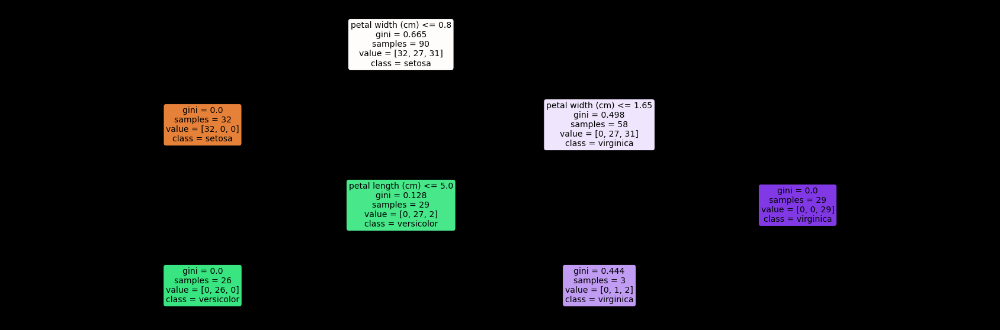

In [ ]:
from sklearn import tree

import matplotlib.pyplot as plt

plt.figure(figsize=(30,10), facecolor ='k')

a = tree.plot_tree(clf,

                   feature_names = feature_names,

                   class_names = labels,

                   rounded = True,

                   filled = True,

                   fontsize=14)

plt.show()

#Exercise:

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(features_dataset,Play_encoded,test_size=0.2,random_state=0)

In [ ]:
data_gini=DecisionTreeClassifier(criterion = "gini",
            random_state = 28,max_depth=28)
data_gini.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=28, random_state=28)

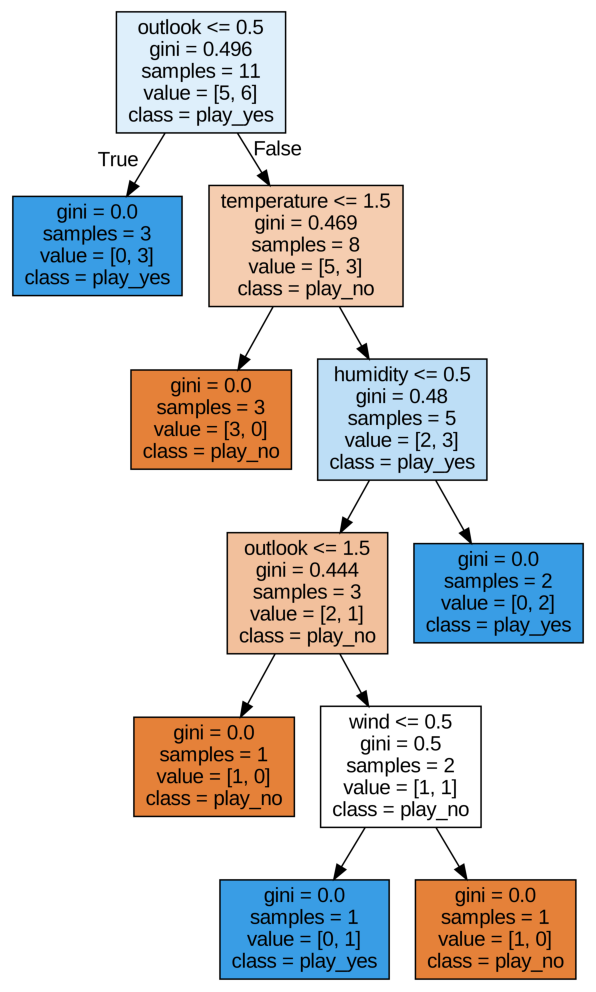

In [ ]:
export_graphviz(data_gini,out_file='tree_gini.dot',feature_names=['outlook','temperature','humidity','wind'],
                class_names=['play_no','play_yes'],filled=True)

call(['dot', '-Tpng', 'tree_gini.dot', '-o', 'tree_gini.png','-Gdpi=600'])

plt.figure(figsize = (14, 18))
plt.imshow(plt.imread('tree_gini.png'))
plt.axis('off');
plt.show();

In [ ]:
# task2
# one hot encoding
 
# import libraries
import numpy as np
import pandas as pd

In [ ]:
from sklearn.datasets import load_digits


In [ ]:
data = load_digits()

In [ ]:
data

{'data': array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ..., 10.,  0.,  0.],
        [ 0.,  0.,  0., ..., 16.,  9.,  0.],
        ...,
        [ 0.,  0.,  1., ...,  6.,  0.,  0.],
        [ 0.,  0.,  2., ..., 12.,  0.,  0.],
        [ 0.,  0., 10., ..., 12.,  1.,  0.]]),
 'target': array([0, 1, 2, ..., 8, 9, 8]),
 'frame': None,
 'feature_names': ['pixel_0_0',
  'pixel_0_1',
  'pixel_0_2',
  'pixel_0_3',
  'pixel_0_4',
  'pixel_0_5',
  'pixel_0_6',
  'pixel_0_7',
  'pixel_1_0',
  'pixel_1_1',
  'pixel_1_2',
  'pixel_1_3',
  'pixel_1_4',
  'pixel_1_5',
  'pixel_1_6',
  'pixel_1_7',
  'pixel_2_0',
  'pixel_2_1',
  'pixel_2_2',
  'pixel_2_3',
  'pixel_2_4',
  'pixel_2_5',
  'pixel_2_6',
  'pixel_2_7',
  'pixel_3_0',
  'pixel_3_1',
  'pixel_3_2',
  'pixel_3_3',
  'pixel_3_4',
  'pixel_3_5',
  'pixel_3_6',
  'pixel_3_7',
  'pixel_4_0',
  'pixel_4_1',
  'pixel_4_2',
  'pixel_4_3',
  'pixel_4_4',
  'pixel_4_5',
  'pixel_4_6',
  'pixel_4_7',
  'pixel_5_0',
  'pixel_5_1',
 

In [ ]:
data['target_names']

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
df = pd.DataFrame(data.data, columns = data.feature_names)
df

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792,0.0,0.0,4.0,10.0,13.0,6.0,0.0,0.0,0.0,1.0,...,4.0,0.0,0.0,0.0,2.0,14.0,15.0,9.0,0.0,0.0
1793,0.0,0.0,6.0,16.0,13.0,11.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,6.0,16.0,14.0,6.0,0.0,0.0
1794,0.0,0.0,1.0,11.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,9.0,13.0,6.0,0.0,0.0
1795,0.0,0.0,2.0,10.0,7.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,5.0,12.0,16.0,12.0,0.0,0.0


In [ ]:
df['Species'] = data.target
target = np.unique(data.target)

target_names = np.unique(data.target_names)

targets = dict(zip(target, target_names))

df['Species'] = df['Species'].replace(targets)

In [ ]:

one_hot_encoded_data = pd.get_dummies(df, columns = data.feature_names)
print(one_hot_encoded_data)

      pixel_0_0_0.0  pixel_0_1_0.0  pixel_0_1_1.0  pixel_0_1_2.0  \
0                 1              1              0              0   
1                 1              1              0              0   
2                 1              1              0              0   
3                 1              1              0              0   
4                 1              1              0              0   
...             ...            ...            ...            ...   
1792              1              1              0              0   
1793              1              1              0              0   
1794              1              1              0              0   
1795              1              1              0              0   
1796              1              1              0              0   

      pixel_0_1_3.0  pixel_0_1_4.0  pixel_0_1_5.0  pixel_0_1_6.0  \
0                 0              0              0              0   
1                 0              0             

In [ ]:
x = df.drop(columns="Species")

y = df["Species"]

feature_names = x.columns

labels = y.unique()

#split the dataset

from sklearn.model_selection import train_test_split

X_train, test_x, y_train, test_lab = train_test_split(x,y,

                                                 test_size = 0.35,

                                                 random_state = 28)

#Cost complexity Pruning

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
from sklearn.tree import DecisionTreeClassifier

X,y = load_breast_cancer(return_X_y=True)
X_train,X_test, y_train, y_test = train_test_split(X,y, random_state=0)


clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas = path.ccp_alphas

print(ccp_alphas)

[0.         0.00226647 0.00464743 0.0046598  0.0056338  0.00704225
 0.00784194 0.00911402 0.01144366 0.018988   0.02314163 0.03422475
 0.32729844]


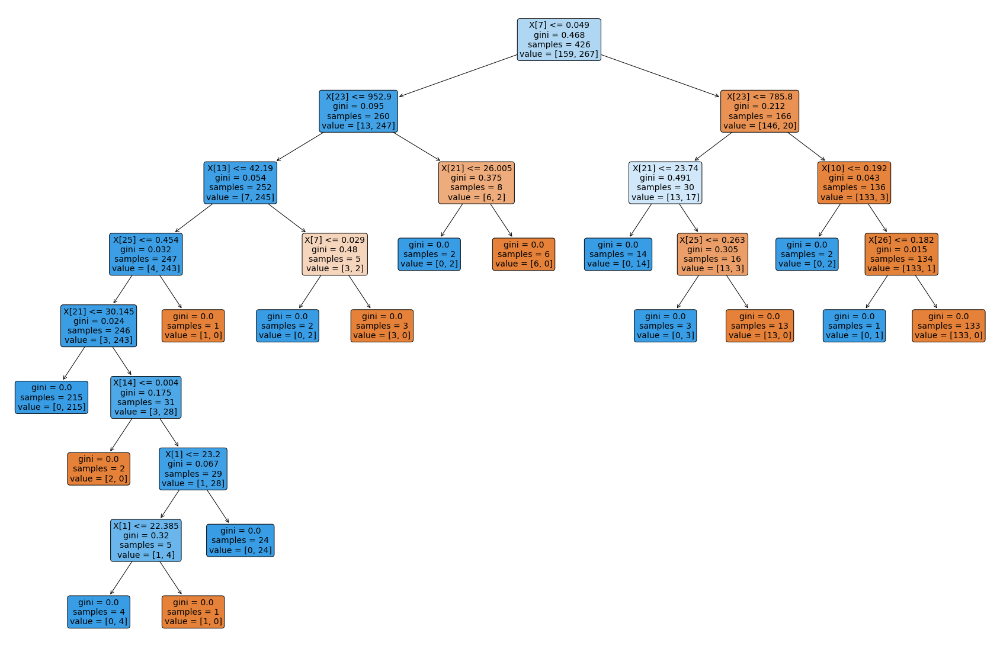

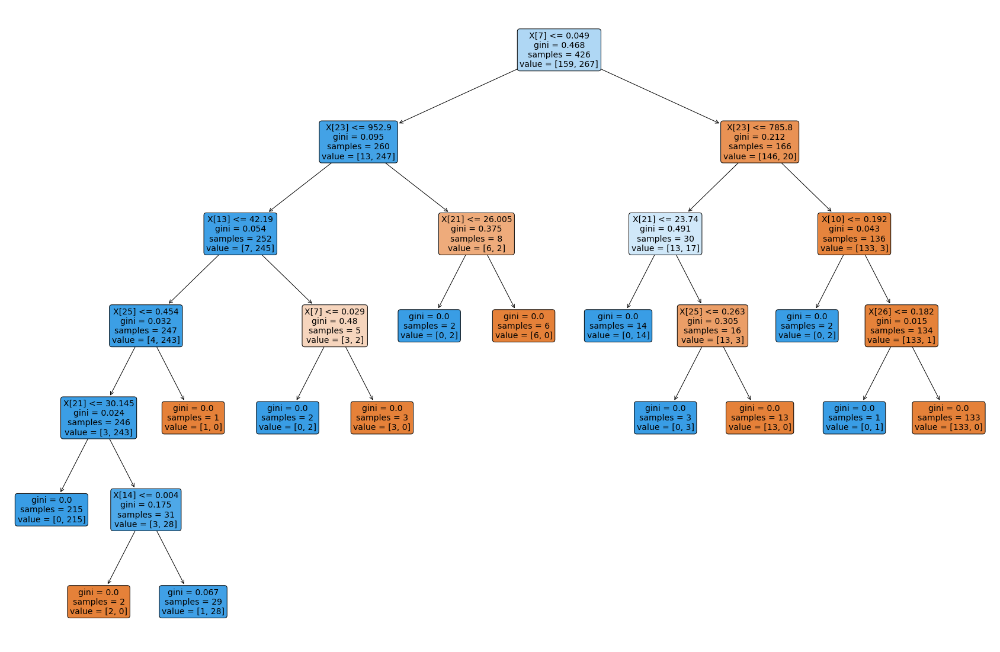

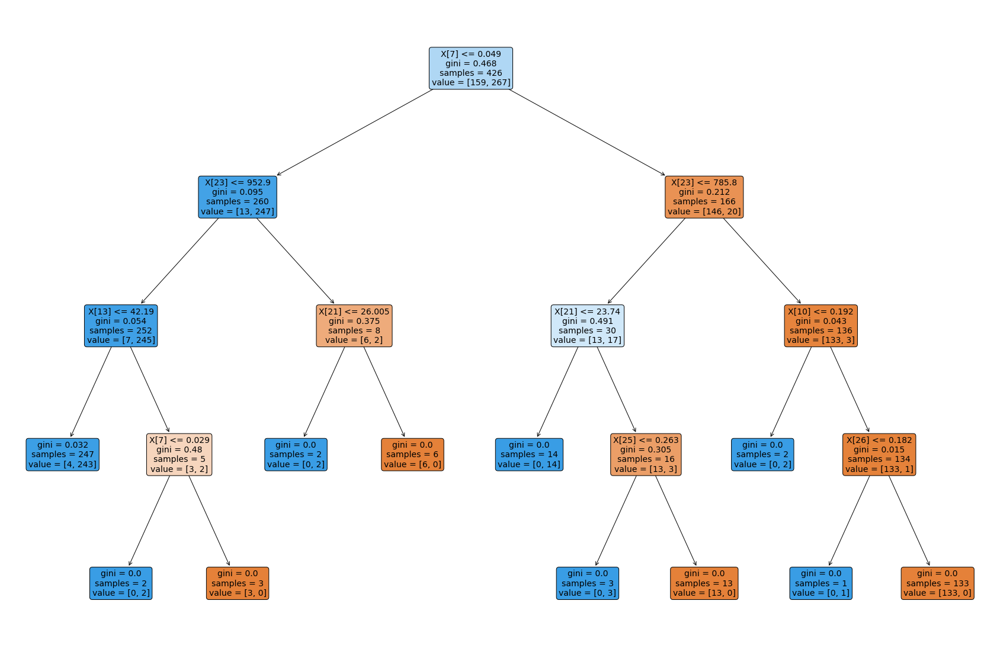

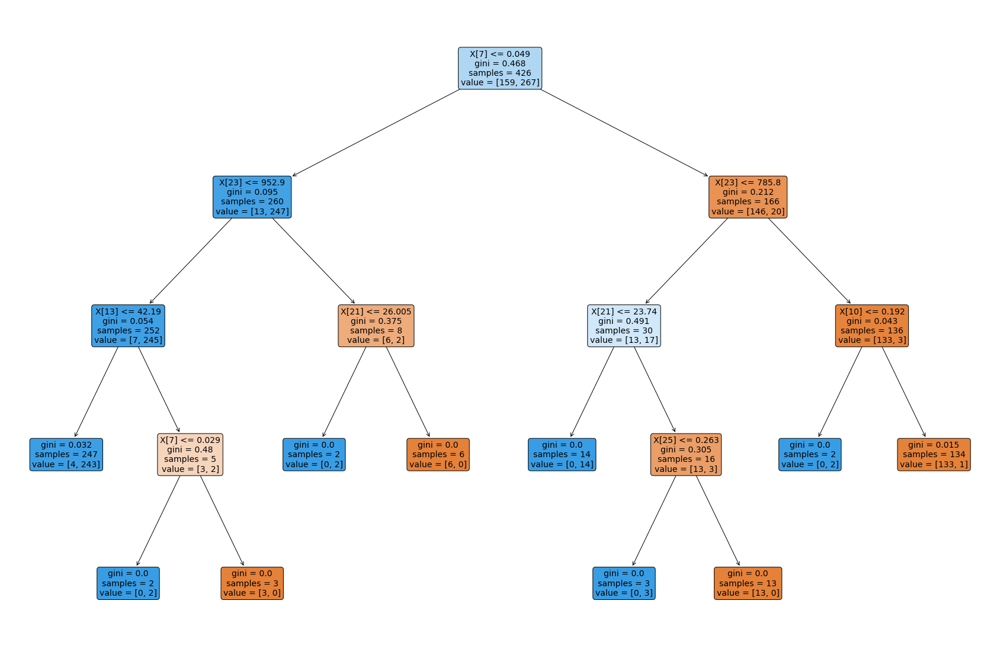

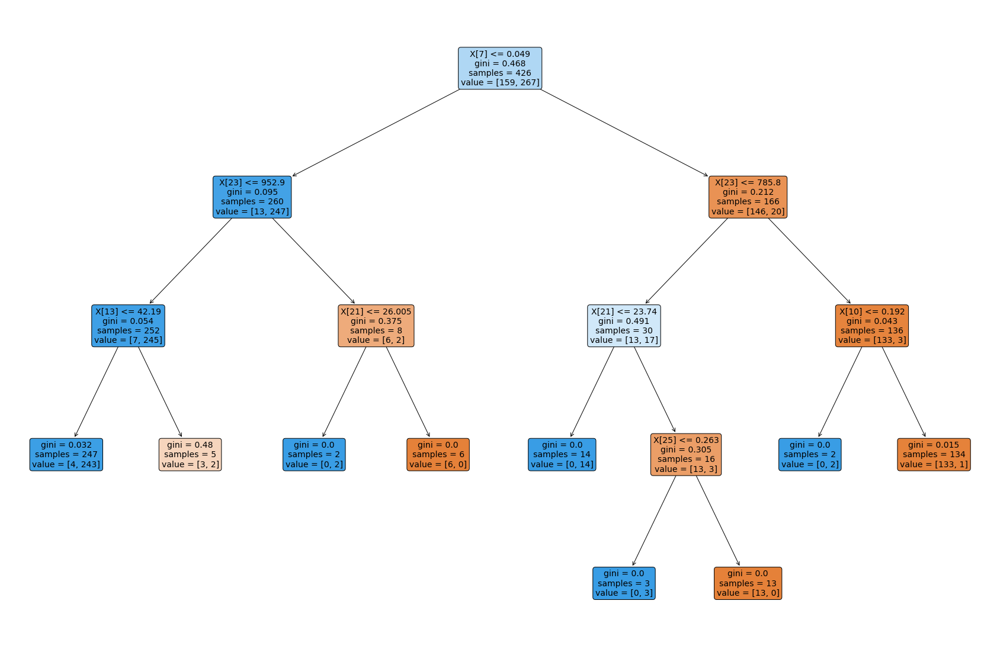

...

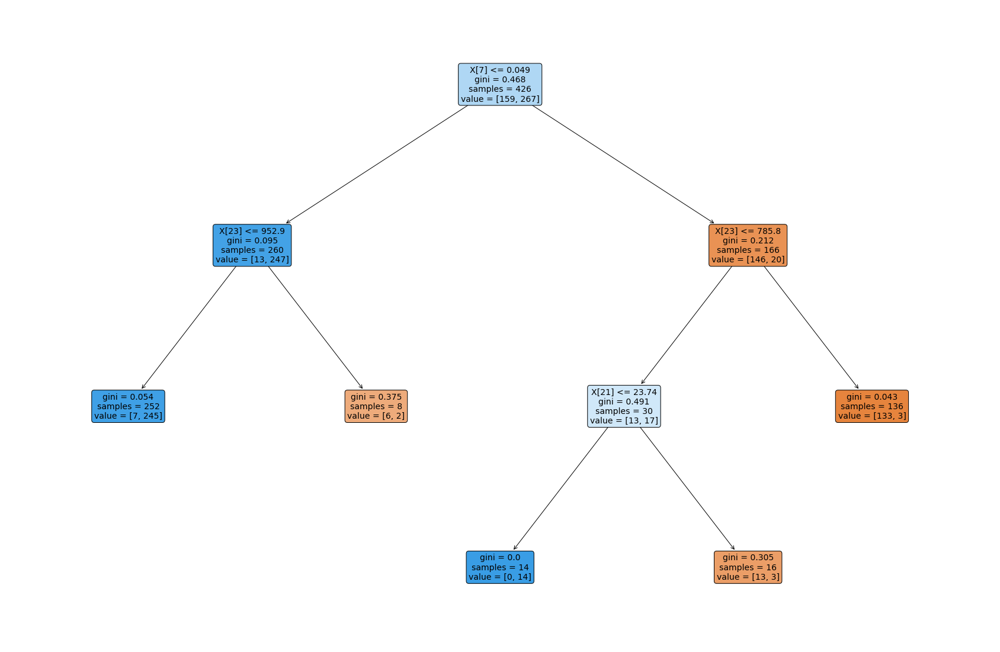

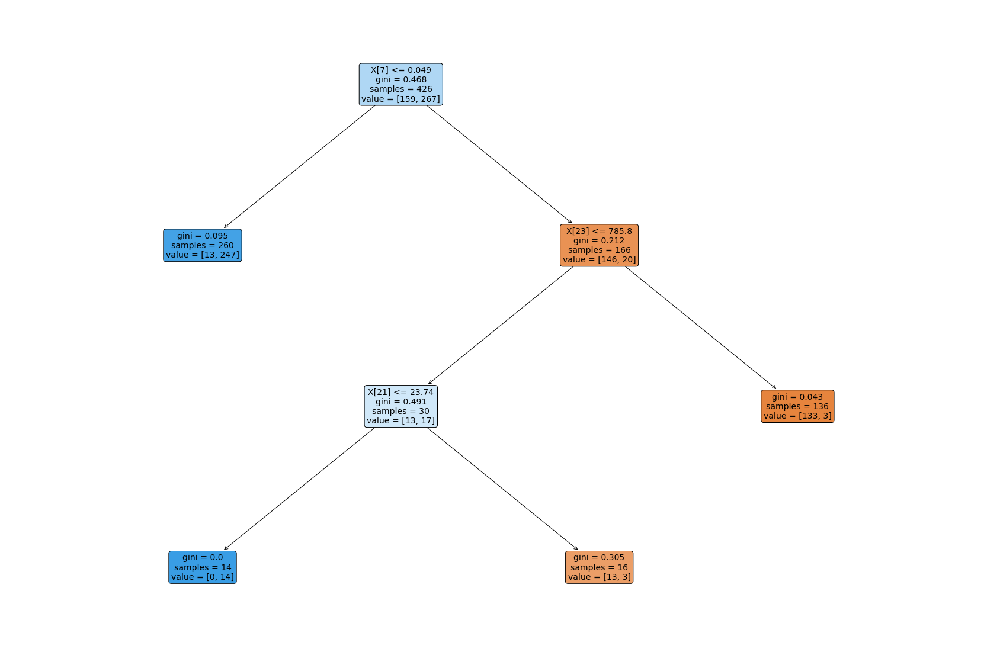

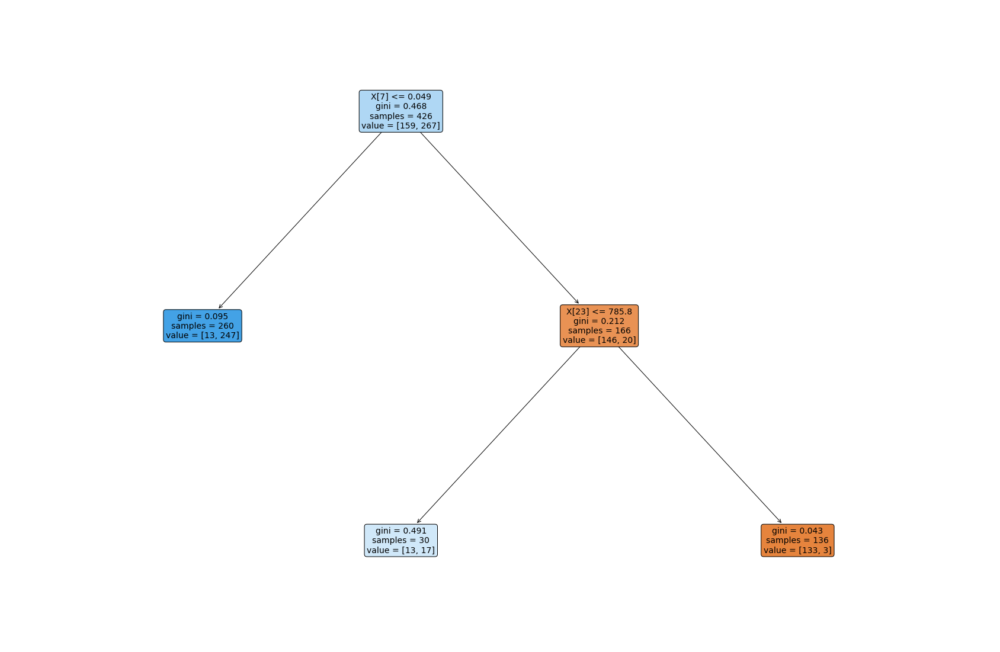

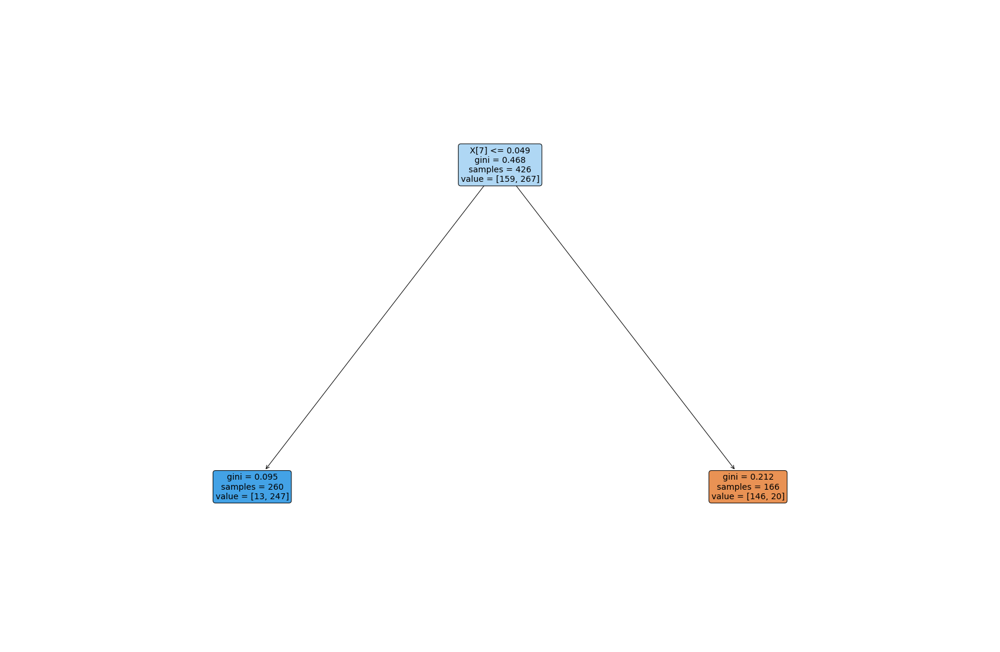

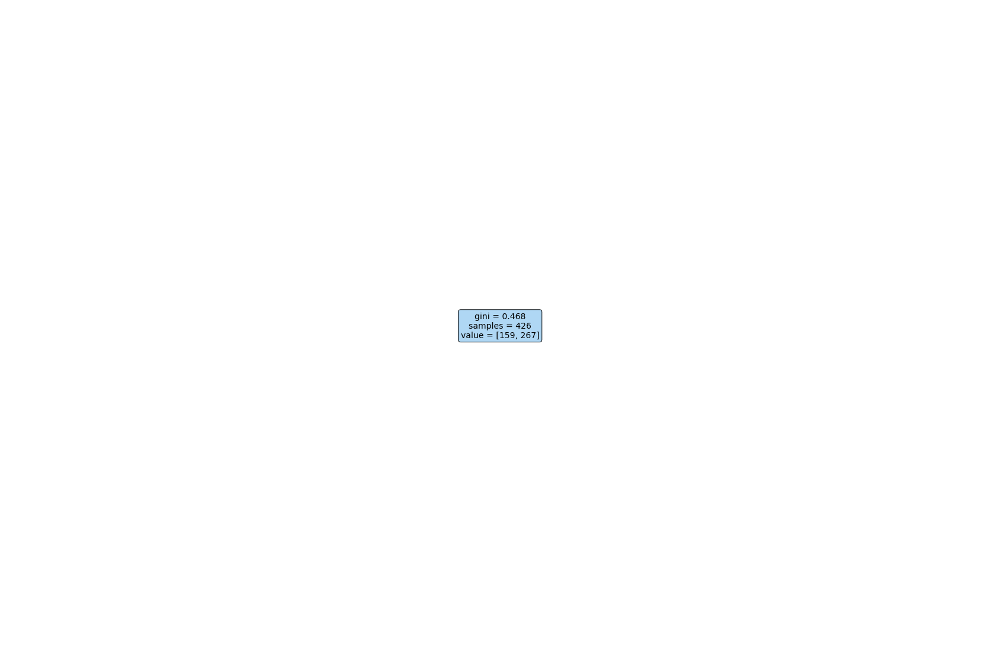

Number of nodes in the last tree is: 1 with ccp_alpha: 0.3272984419327777
Number of nodes in the tree in starting is: 31 with ccp_alpha: 0.0


In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
  clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf.fit(X_train, y_train)
  clfs.append(clf)
  plt.figure(figsize=(30,20))
  a = tree.plot_tree(clf, rounded = True, filled = True, fontsize=14)
  plt.show()
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
clfs[-1].tree_.node_count, ccp_alphas[-1]
)
)
print("Number of nodes in the tree in starting is: {} with ccp_alpha: {}".format(clfs[0].tree_.node_count, ccp_alphas[0]))

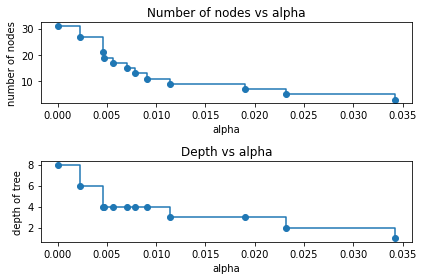

In [ ]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

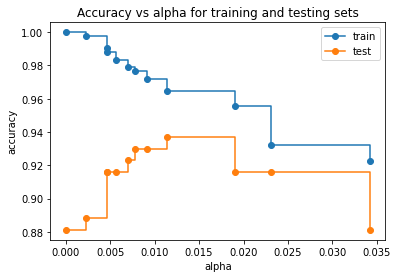

In [ ]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
clf1 = DecisionTreeClassifier(ccp_alpha=0.0125, criterion='gini')
path1 = clf1.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas1 = path1.ccp_alphas

print(ccp_alphas1)


[0.         0.00226647 0.00464743 0.0046598  0.0056338  0.00704225
 0.00784194 0.00911402 0.01144366 0.018988   0.02314163 0.03422475
 0.32729844]



For Training Data



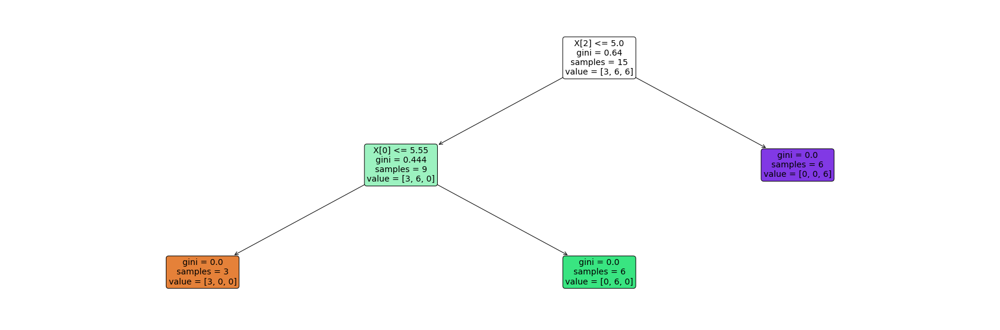

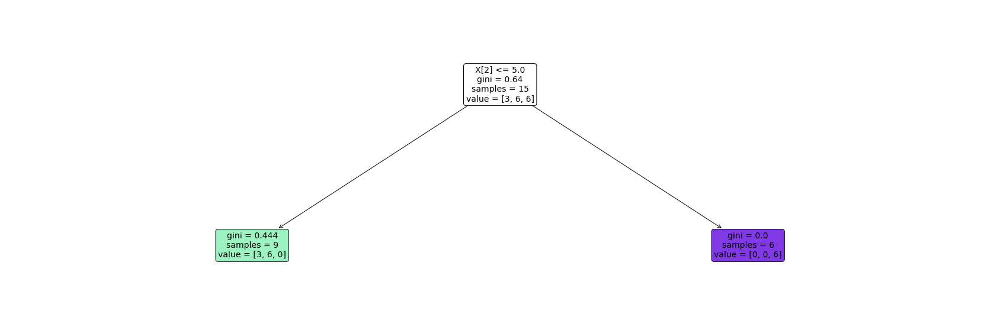

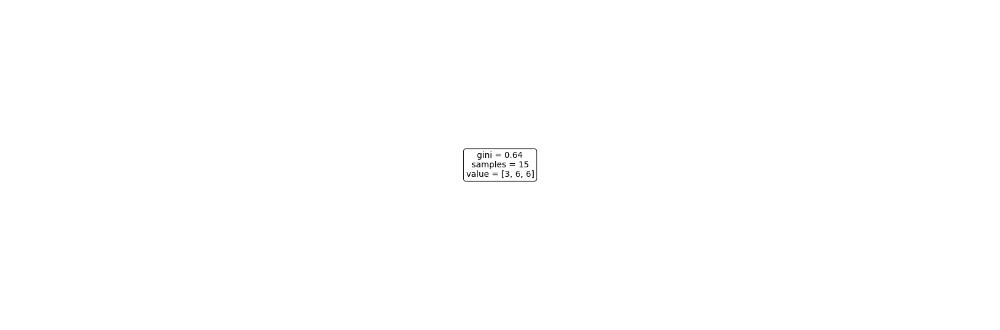


For Test Data



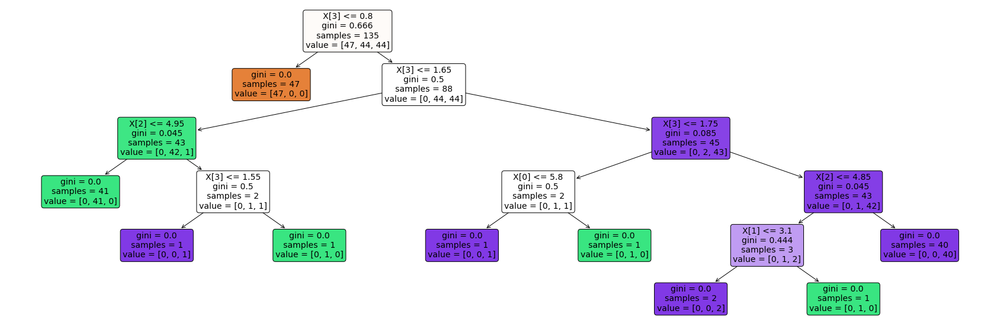

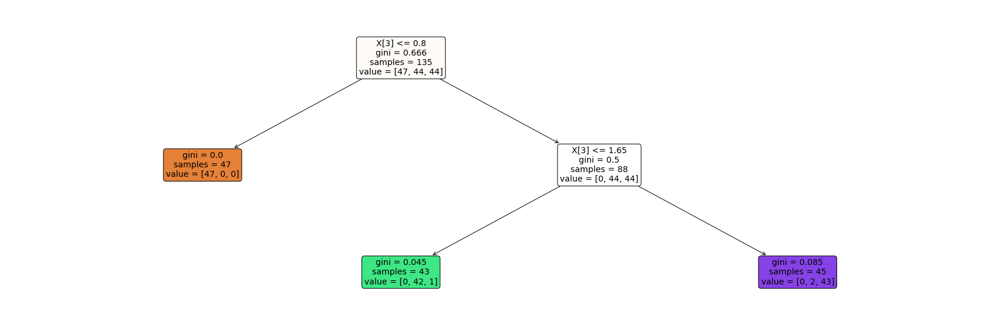

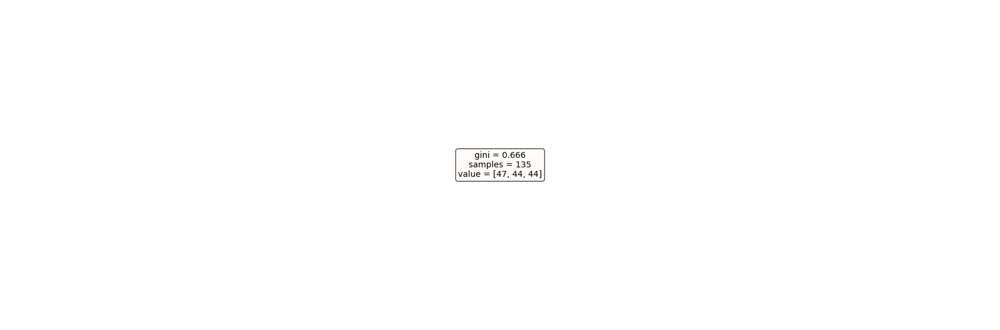

In [ ]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
import pandas as pd

from sklearn.datasets import load_iris

_feature, _label = load_iris(return_X_y=True)
trainFeatures, testFeatures, trainLabels, testLabels = train_test_split(_feature, _label, test_size = 0.9, random_state=1)

data = load_iris()

features = np.array(data.data)
labels = np.array(data.target)

model = DecisionTreeClassifier()

path = model.cost_complexity_pruning_path(trainFeatures, trainLabels)
alphas = path.ccp_alphas

print("\nFor Training Data\n")
models = []
for alpha in alphas:
  model = DecisionTreeClassifier(ccp_alpha=alpha)
  model.fit(trainFeatures, trainLabels)
  models.append(model)

  plt.figure(figsize=(30,10))
  a = tree.plot_tree(model, rounded = True, filled = True, fontsize=14)
  plt.show()

print("\nFor Test Data\n")
models = []
for alpha in alphas:
  model = DecisionTreeClassifier(ccp_alpha=alpha)
  model.fit(testFeatures, testLabels)
  models.append(model)

  plt.figure(figsize=(30,10))
  a = tree.plot_tree(model, rounded = True, filled = True, fontsize=14)
  plt.show()


For Training Data



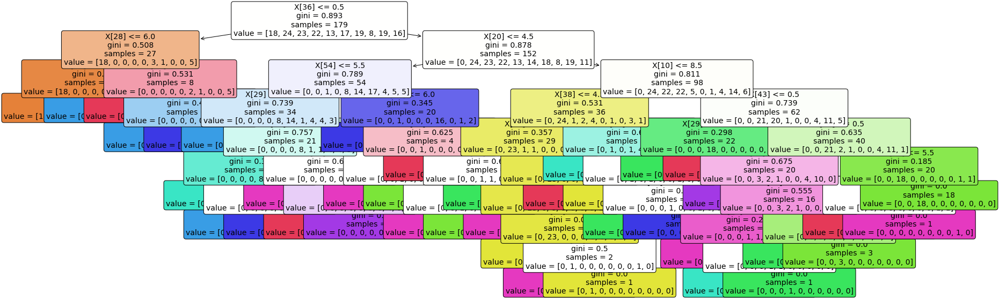

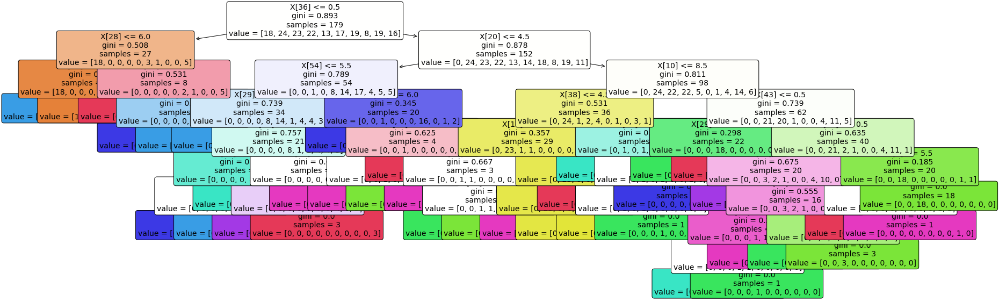

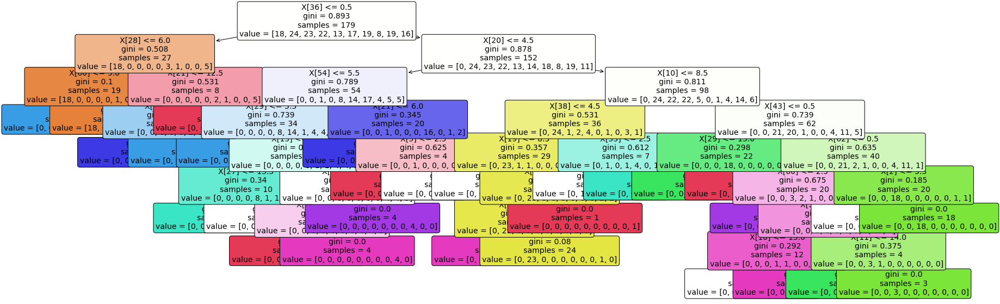

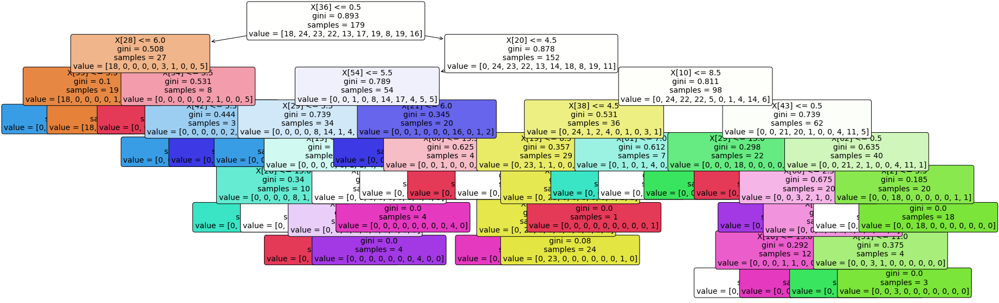

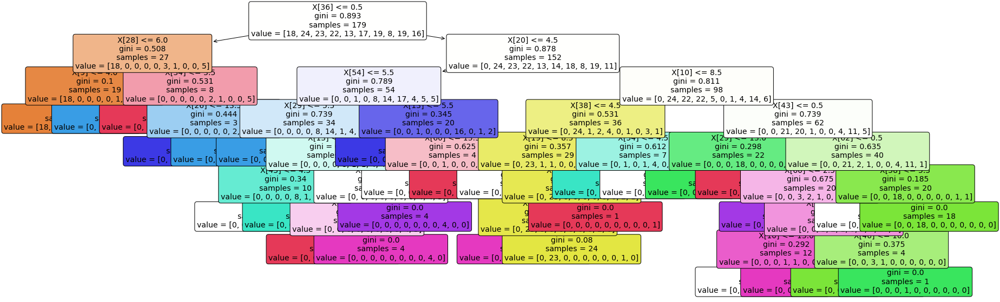

...

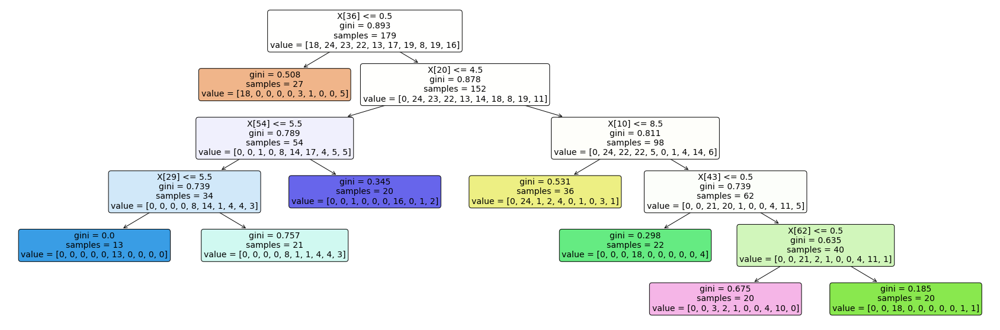

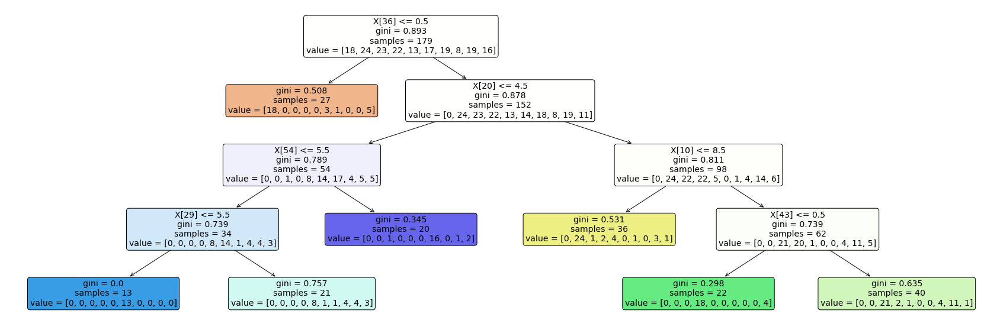

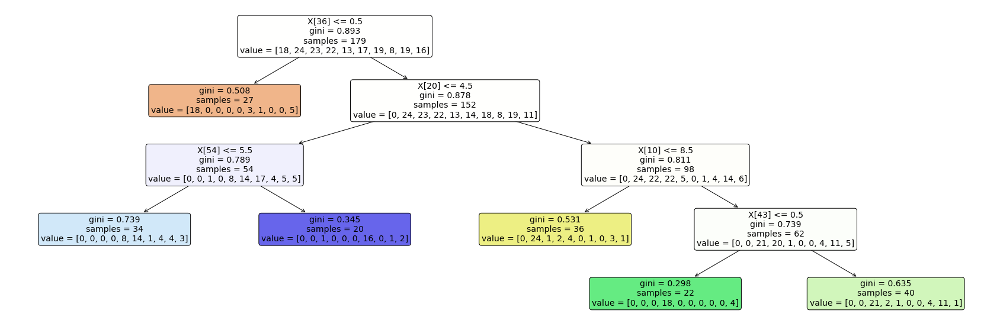

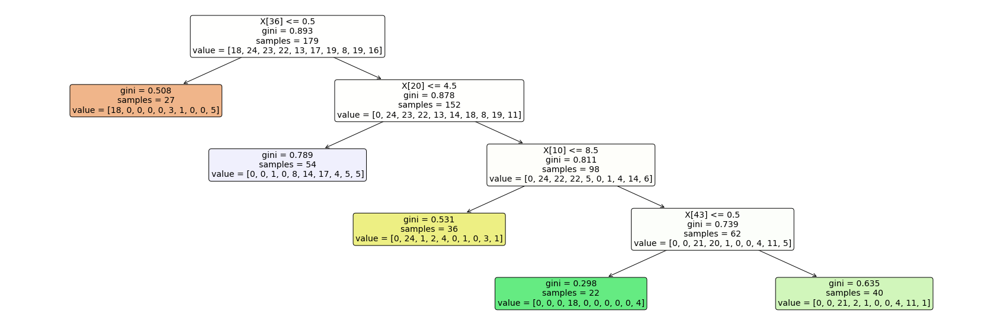

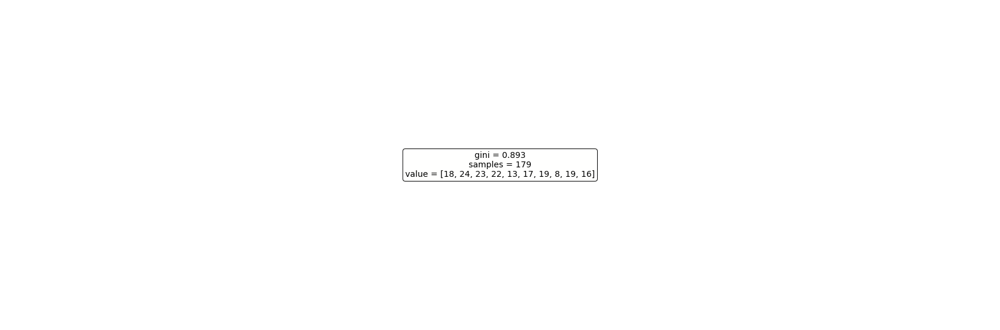


For Test Data



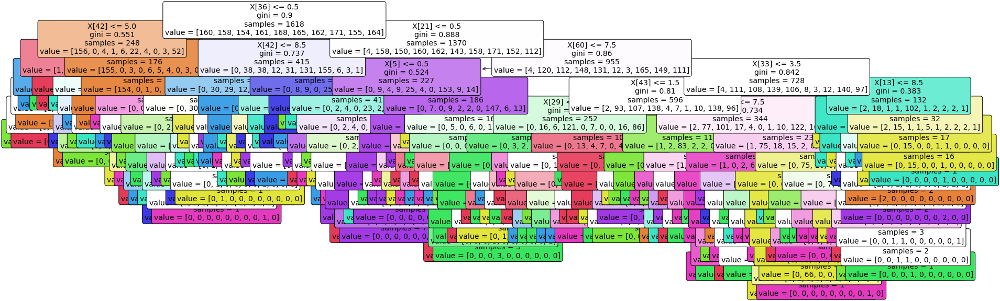

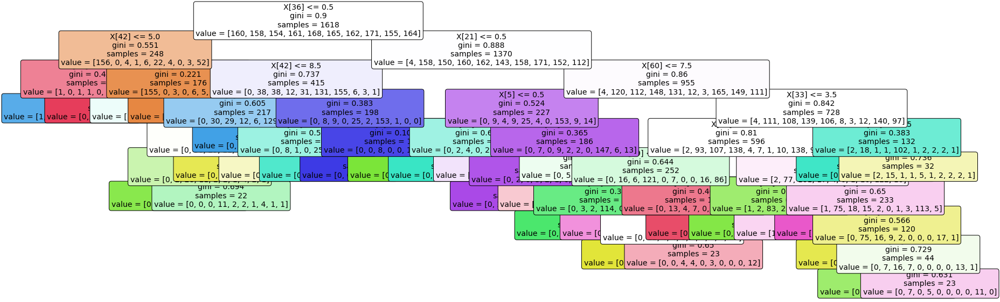

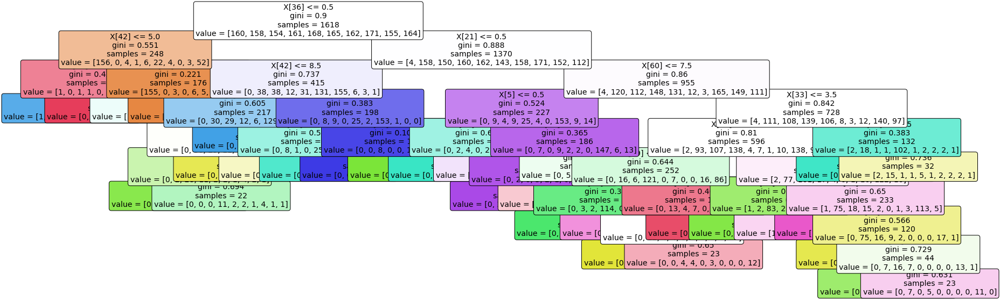

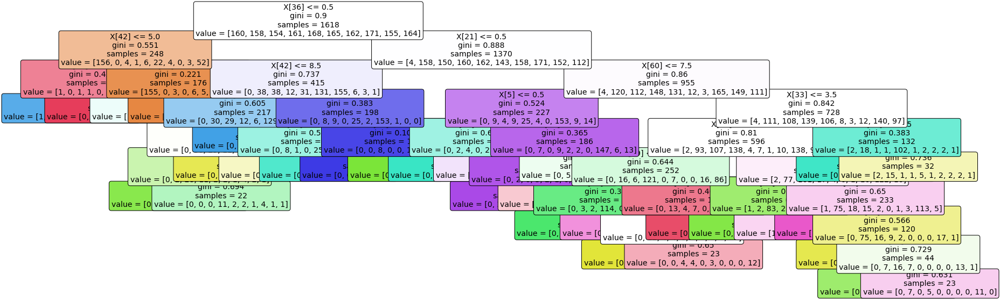

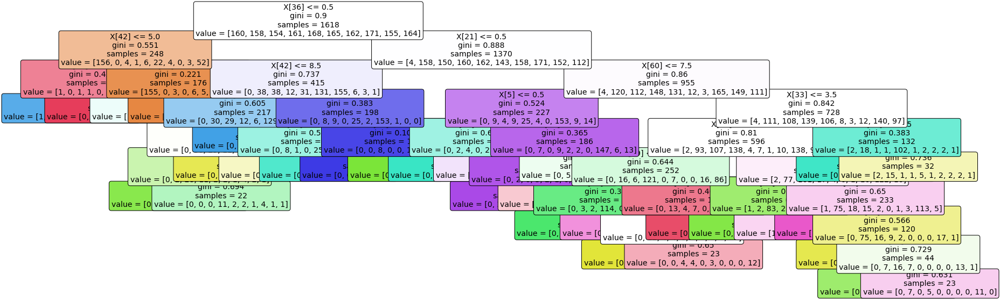

...

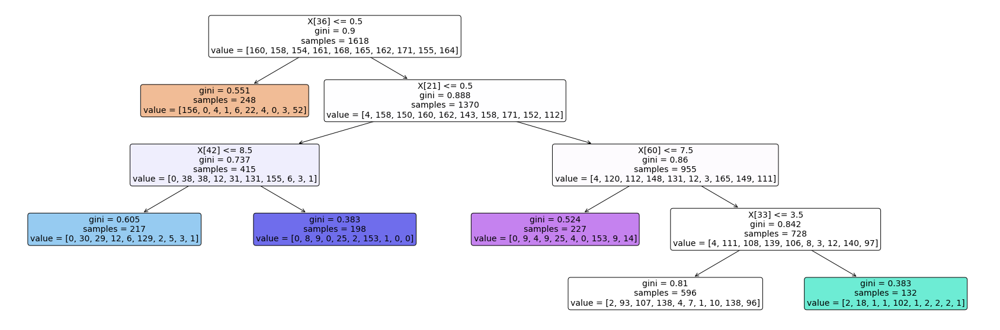

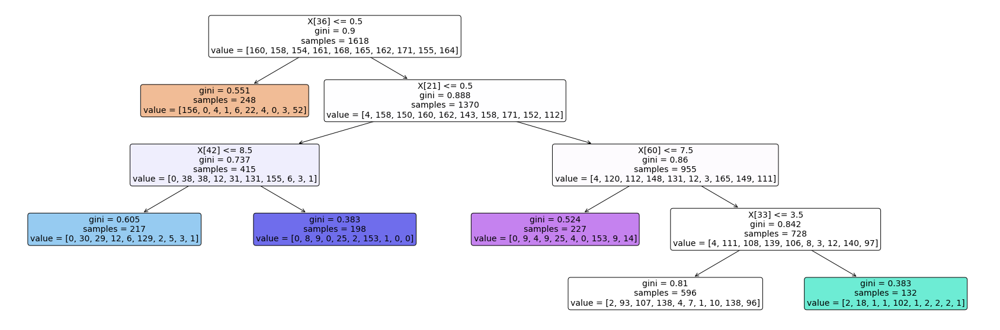

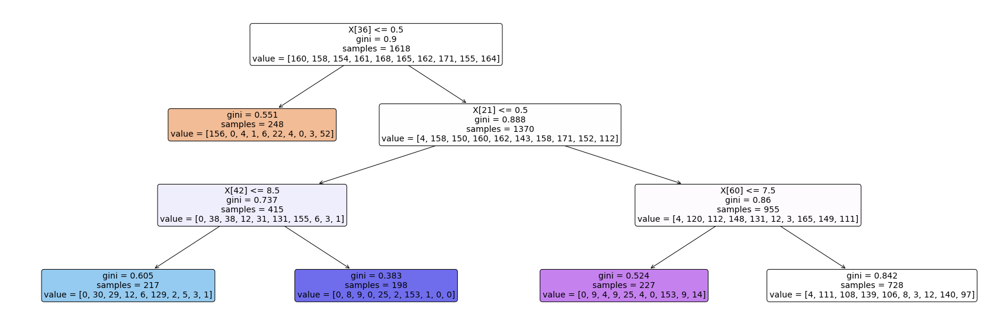

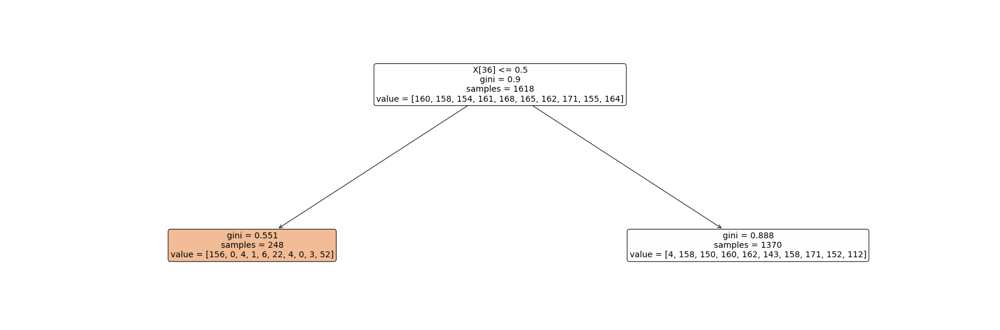

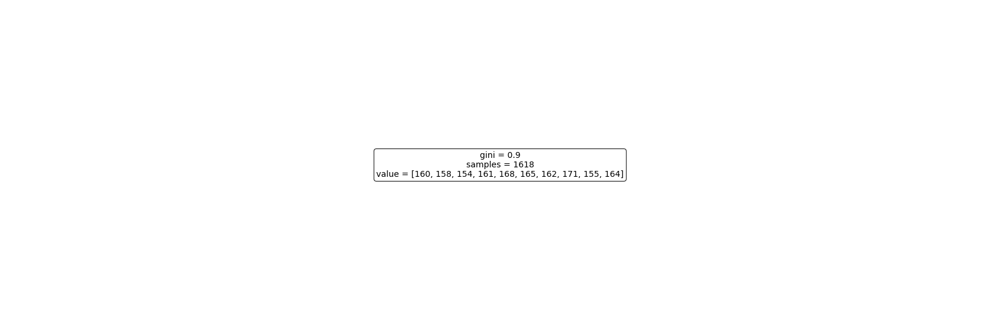

In [34]:
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
import pandas as pd

from sklearn.datasets import load_digits

_feature, _label = load_digits(return_X_y=True)
trainFeatures, testFeatures, trainLabels, testLabels = train_test_split(_feature, _label, test_size = 0.9, random_state=1)

data = load_digits()

features = np.array(data.data)
labels = np.array(data.target)

model = DecisionTreeClassifier()

path = model.cost_complexity_pruning_path(trainFeatures, trainLabels)
alphas = path.ccp_alphas

print("\nFor Training Data\n")
models = []
for alpha in alphas:
  model = DecisionTreeClassifier(ccp_alpha=alpha)
  model.fit(trainFeatures, trainLabels)
  models.append(model)

  plt.figure(figsize=(30,10))
  a = tree.plot_tree(model, rounded = True, filled = True, fontsize=14)
  plt.show()

print("\nFor Test Data\n")
models = []
for alpha in alphas:
  model = DecisionTreeClassifier(ccp_alpha=alpha)
  model.fit(testFeatures, testLabels)
  models.append(model)

  plt.figure(figsize=(30,10))
  a = tree.plot_tree(model, rounded = True, filled = True, fontsize=14)
  plt.show()